## Figure 4 time series of ASC and cross slope heat transport in individual bins

In [1]:
import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr
import cmocean.cm as cmocean
import glob
import matplotlib.path as mpath
import matplotlib.colors as col
import pandas as pd
import scipy.stats as stats
from tqdm import tqdm
import logging
import matplotlib.cm as cm
from dask.distributed import Client
import matplotlib.colors as col
import matplotlib.gridspec as gs

logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

figdir = '/g/data/g40/akm157/figures/ASC_heat_trans/time_series/'

In [2]:
client = Client(threads_per_worker = 1)

2025-08-27 15:31:01,503 - distributed.scheduler - WARNING - Received heartbeat from unregistered worker 'tcp://127.0.0.1:36237'.
2025-08-27 15:31:01,504 - distributed.scheduler - WARNING - Received heartbeat from unregistered worker 'tcp://127.0.0.1:37927'.
2025-08-27 15:31:01,505 - distributed.scheduler - WARNING - Received heartbeat from unregistered worker 'tcp://127.0.0.1:35569'.
2025-08-27 15:31:01,505 - distributed.scheduler - WARNING - Received heartbeat from unregistered worker 'tcp://127.0.0.1:40735'.
2025-08-27 15:31:01,506 - distributed.scheduler - WARNING - Received heartbeat from unregistered worker 'tcp://127.0.0.1:33681'.
2025-08-27 15:31:01,506 - distributed.scheduler - WARNING - Received heartbeat from unregistered worker 'tcp://127.0.0.1:43513'.
2025-08-27 15:31:01,507 - distributed.scheduler - WARNING - Received heartbeat from unregistered worker 'tcp://127.0.0.1:41707'.
2025-08-27 15:31:01,508 - distributed.scheduler - WARNING - Received heartbeat from unregistered 

In [3]:
exp = '01deg_jra55v140_iaf_cycle3'
start_time= '1958-01-01'
end_time= '2018-12-31'
lat_range = slice(-90,-59)
isobath_depth = 1000

session = cc.database.create_session()

## First open u_along in density layers to use for compositing, and to show in time series:

In [4]:
# Load the along-slope velocity field for annual time series
u_along = xr.open_mfdataset('/g/data/ik11/users/wf4500/ASC_project_files/ASC_10deg_bin.nc')

# resample monthly:
u_along_da_months = u_along.resample(time='1M').mean()
u_along_da_months = u_along_da_months.sel(potrho0=slice(13.8,28.42))
u_along_da_months.load();

####################

# load monthly water mass mask:
age_mask_monthly = xr.open_mfdataset('/g/data/v45/wf4500/ASC_project_files/**_age_mask.nc')

# select out CDW layer:
u_along_da_months_binned_CDW = (age_mask_monthly.CDW_mask*u_along_da_months)

####################

# get volume for averaging across density layers:
vol_bins = xr.open_mfdataset('/g/data/v45/wf4500/ASC_project_files/Volume_rho_10deg_bins.nc')
'''
CORRECTED FROM https://github.com/willaguiar/ASC_and_heat_transport/issues/47#issuecomment-2875013080
# do volume-weighted density average and annual averaging:
def vol_ave_potrho0_potmask(quantity,vol_bins):
    return (quantity * vol_bins.volume).mean('potrho0')/vol_bins.mean('potrho0').volume
'''
def vol_ave_potrho0_potmask(mask, quantity,vol_bins):
    return (mask * quantity * vol_bins.volume).mean('potrho0')/(mask*vol_bins.volume).mean('potrho0')

U_along_annual_binned_CDW_volav = vol_ave_potrho0_potmask(age_mask_monthly.CDW_mask, u_along_da_months_binned_CDW,vol_bins).groupby('time.year').mean('time')
U_along_annual_binned_CDW_volav = U_along_annual_binned_CDW_volav.load()

In [5]:
vol_bins_monthly=vol_bins.copy()

# Need to multiply by daily mask BEFORE taking climatology!! 

In [6]:
# Load the along-slope velocity field, seasonal climatology using daily data
# NEED THIS AS TIME SERIES NOT CLIMATOLOGY:
u_along = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/ASC_sigma_daily_10deg/OM2_01_iaf_cycle3/U_daily_10deg_****-**.nc')
####################

# load daily climatology water mass mask:
age_mask_daily = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/age_mask_daily/OM2_01_iaf_cycle3/CDW_****-**.nc')

# select out CDW layer:
u_along_clima_binned_CDW = (age_mask_daily.CDW_mask*u_along)

####################

# get volume for averaging across density layers:
# NEED THIS AS TIME SERIES NOT CLIMATOLOGY:
vol_bins = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/volume_daily_10deg/OM2_01_iaf_cycle3/VOL*.nc')
# do volume-weighted density average:
# Corrected as in cell above
def vol_ave_potrho0_potmask(mask, quantity,vol_bins):
    return (mask * quantity * vol_bins.Volume).mean('potrho0')/(mask*vol_bins.Volume).mean('potrho0')

U_along_clima_binned_CDW_volav = vol_ave_potrho0_potmask(age_mask_daily.CDW_mask, u_along_clima_binned_CDW,vol_bins)

# compute seasonal climatology:
U_along_clima_binned_CDW_volav = U_along_clima_binned_CDW_volav.groupby('time.dayofyear').mean('time')

U_along_clima_binned_CDW_volav = U_along_clima_binned_CDW_volav.load()

In [7]:
age_mask_daily_DSW = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/age_mask_daily/OM2_01_iaf_cycle3/DSW_****-**.nc')
u_along_clima_binned_DSW = (age_mask_daily_DSW.DSW_mask*u_along)
U_along_clima_binned_DSW_volav = vol_ave_potrho0_potmask(age_mask_daily_DSW.DSW_mask, u_along_clima_binned_DSW,vol_bins)

# compute seasonal climatology:
U_along_clima_binned_DSW_volav = U_along_clima_binned_DSW_volav.groupby('time.dayofyear').mean('time')

U_along_clima_binned_DSW_volav = U_along_clima_binned_DSW_volav.load()

In [8]:
u_along_clima_binned_DSW

<xarray.Dataset> Size: 693MB
Dimensions:   (time: 22280, potrho0: 108, lon_bins: 36)
Coordinates:
  * time      (time) datetime64[ns] 178kB 1958-01-01T12:00:00 ... 2018-12-31T...
  * potrho0   (potrho0) float64 864B 21.5 23.07 23.22 ... 28.13 28.14 29.08
  * lon_bins  (lon_bins) float64 288B -273.5 -263.5 -253.5 ... 56.5 66.5 76.5
Data variables:
    U         (time, potrho0, lon_bins) float64 693MB dask.array<chunksize=(31, 108, 36), meta=np.ndarray>

In [9]:
u_along_da_months_binned_DSW = (age_mask_monthly.DSW_mask*u_along_da_months)
#u_along_da_months_binned_DSW = u_along_clima_binned_DSW.resample(time='1M').mean()
u_along_da_months_binned_DSW['time']=age_mask_monthly.time
# vol_bins_monthlyforDSW= vol_bins.resample(time='1M').mean()
# vol_bins_monthlyforDSW['time']=age_mask_monthly.time
U_along_annual_binned_DSW_volav = vol_ave_potrho0_potmask(age_mask_monthly.DSW_mask, u_along_da_months_binned_DSW,vol_bins_monthly.rename({'volume':'Volume'})).groupby('time.year').mean('time')
U_along_annual_binned_DSW_volav = U_along_annual_binned_DSW_volav.load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/dask/_task_spec.py:740: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


In [10]:
#vertical mean U
u_along_watercolumn = u_along.U.weighted(vol_bins.Volume.fillna(0)).mean('potrho0')
u_along_surf = u_along.U.bfill('potrho0').isel(potrho0=0)
u_along_watercolumn_clima = u_along_watercolumn.groupby('time.dayofyear').mean('time')
u_along_watercolumn_clima = u_along_watercolumn_clima.load()
u_along_surf_clima = u_along_surf.groupby('time.dayofyear').mean('time')
u_along_surf_clima = u_along_surf_clima.load()


In [11]:
#vertical mean U
u_along_watercolumn_annual = u_along_watercolumn.resample(time='1Y').mean()
u_along_watercolumn_annual = u_along_watercolumn_annual.load()
u_along_surf_annual = u_along_surf.resample(time='1Y').mean()
u_along_surf_annual = u_along_surf_annual.load()


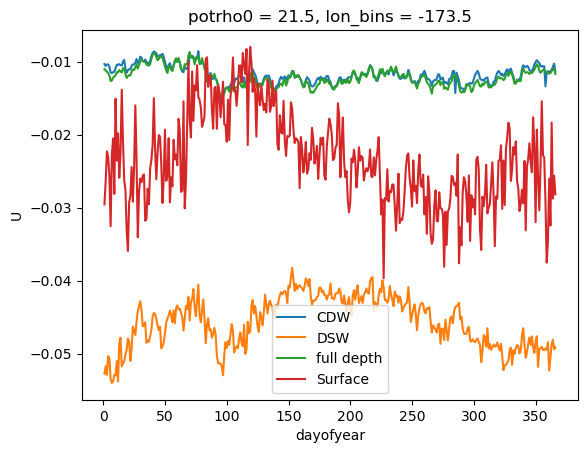

In [12]:

U_along_clima_binned_CDW_volav.U.sel(lon_bins=-173.5).plot(label='CDW')
U_along_clima_binned_DSW_volav.U.sel(lon_bins=-173.5).plot(label='DSW')
u_along_watercolumn_clima.sel(lon_bins=-173.5).plot(label='full depth')
u_along_surf_clima.sel(lon_bins=-173.5).plot(label='Surface')
plt.legend()

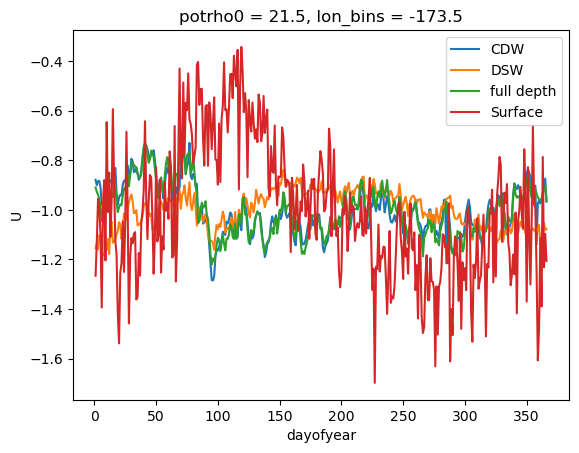

In [13]:
#normalized for comparisson

(-U_along_clima_binned_CDW_volav.U.sel(lon_bins=-173.5)/U_along_clima_binned_CDW_volav.U.sel(lon_bins=-173.5).mean('dayofyear')).plot(label='CDW')
(-U_along_clima_binned_DSW_volav.U.sel(lon_bins=-173.5)/U_along_clima_binned_DSW_volav.U.sel(lon_bins=-173.5).mean('dayofyear')).plot(label='DSW')
(-u_along_watercolumn_clima.sel(lon_bins=-173.5)/u_along_watercolumn_clima.sel(lon_bins=-173.5).mean('dayofyear')).plot(label='full depth')
(-u_along_surf_clima.sel(lon_bins=-173.5)/u_along_surf_clima.sel(lon_bins=-173.5).mean('dayofyear')).plot(label='Surface')
plt.legend()

In [14]:
u_along_surf_annual2 = u_along_surf_annual.rename({'time':'year'})
u_along_surf_annual2['year']=U_along_annual_binned_CDW_volav.year

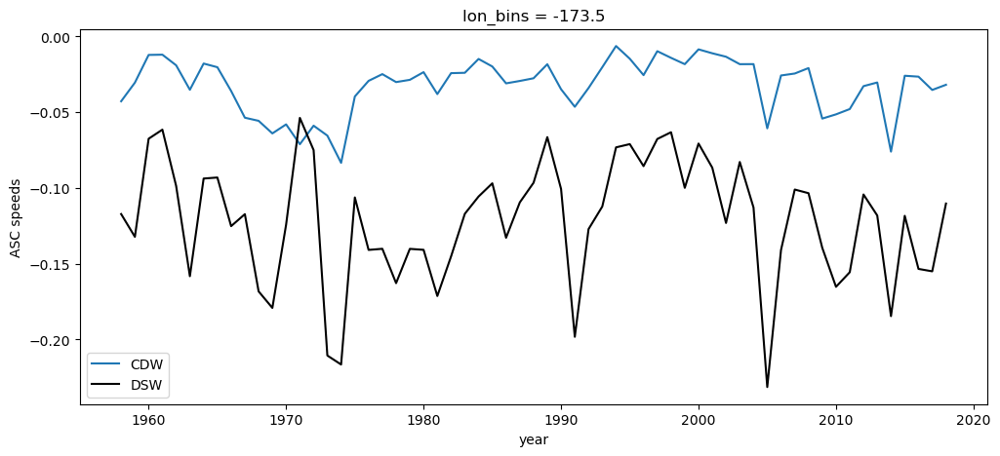

In [15]:
plt.figure(figsize=(12,5))
# u_along_watercolumn_annual2 = u_along_watercolumn_annual.rename({'time':'year'})
# u_along_watercolumn_annual2['year'] = u_along_surf_annual2.year
# u_along_watercolumn_annual2.sel(lon_bins=-173.5).plot(label='full depth')
# u_along_surf_annual2.sel(lon_bins=-173.5).plot(label='surface')
U_along_annual_binned_CDW_volav.U.sel(lon_bins=-173.5).plot(label='CDW')
U_along_annual_binned_DSW_volav.U.sel(lon_bins=-173.5).plot(label='DSW',color='black')
plt.ylabel('ASC speeds')
plt.legend()

Notice that the peak velocity in the CDW layer is different than the DSW layer

## Then open CSHT in density layers for time series:

In [16]:
# Load CSHT field annual
#CSHT_along = xr.open_mfdataset('/g/data/hh5/tmp/access-om/fbd581/ASC_project/Lon_binning/CSHT_ZC_potrho0_10degBins.nc')
CSHT_along = xr.open_mfdataset('/g/data/e14/fbd581/ASC_project/Lon_binning/CSHT_ZC_potrho0_10degBins.nc')
# resample monthly:
CSHT_along_monthly = CSHT_along.resample(time='1M').mean()

# apply age mask to select out CDW layer:
CSHT_months_binned_CDW = (age_mask_monthly.CDW_mask * CSHT_along_monthly )

# annual averaging and sum over layers:
CSHT_annual_binned_CDW = CSHT_months_binned_CDW.groupby('time.year').mean('time').sum(dim = 'potrho0')

# Need to multiply by daily mask BEFORE taking climatology!! 

In [17]:
# climatological averaging:
CSHT_along_daily = CSHT_along

# apply age mask to select out CDW layer:
CSHT_months_binned_CDW = (age_mask_daily.CDW_mask * CSHT_along_daily )

# sum over layers:
CSHT_clima_binned_CDW = CSHT_months_binned_CDW.sum(dim = 'potrho0')

# compute seasonal climatology:
CSHT_clima_binned_CDW = CSHT_clima_binned_CDW.groupby('time.dayofyear').mean('time')
CSHT_clima_binned_CDW = CSHT_clima_binned_CDW.load()

## First need to open correlation data to figure out what longitude bins we want:

In [18]:
files_path = '/g/data/ik11/users/wf4500/ASC_project_files/'
file_extension = 'agemaskCDW_volav_corr'

ds = xr.open_dataset(files_path + 'r_sq_annual_10degBins_' + file_extension + '.nc')
r_sq_annual_10deg = ds.r_sq_annual
ds.close()

high_corr_lons = r_sq_annual_10deg.where(r_sq_annual_10deg>0.3,drop=True).lon_bins.values

In [19]:
# cd /g/data/ik11/users/wf4500/ASC_project_files/

In [20]:
ds_daily = xr.open_dataset(files_path + 'r_sq_clima_10degBins_agemaskCDW_daily_APR10.nc')
r_sq_clim_daily = ds_daily.r_sq_clim

In [21]:
r_sq_annual_10deg.lon_bins

<xarray.DataArray 'lon_bins' (lon_bins: 36)> Size: 288B
array([-273.5, -263.5, -253.5, -243.5, -233.5, -223.5, -213.5, -203.5, -193.5,
       -183.5, -173.5, -163.5, -153.5, -143.5, -133.5, -123.5, -113.5, -103.5,
        -93.5,  -83.5,  -73.5,  -63.5,  -53.5,  -43.5,  -33.5,  -23.5,  -13.5,
         -3.5,    6.5,   16.5,   26.5,   36.5,   46.5,   56.5,   66.5,   76.5])
Coordinates:
  * lon_bins  (lon_bins) float64 288B -273.5 -263.5 -253.5 ... 56.5 66.5 76.5

In [22]:
longitude_slices = np.array([-63.5,-133.5,-243.5,-143.5,-173.5,-103.5, -33.5, -13.5, 76.5,-263.5])
## Check if high_correlation lons align with the regions we have selected:
print(np.isin(longitude_slices,high_corr_lons))
regions = ['West Antarctic Peninsula', 'Getz', 'Totten',\
           'Getz West', 'Glomar', 'Amundsen', 'Filchner', \
           'Riiser-Larsen', 'Amery', 'Denman'] # Note Getz East --> Getz for plotting

[ True  True False  True  True  True  True  True  True  True]


## Then plot interannual and seasonal time series for the same 3 regions in Figure 3

# Check interannual time series here!! I think it is doing wrong region maybe?

In [23]:
regions_selected = ['Getz', 'West Antarctic Peninsula', 'Glomar']
inds_regions = np.where(np.isin(regions, regions_selected))[0]
print(inds_regions)

[0 1 4]


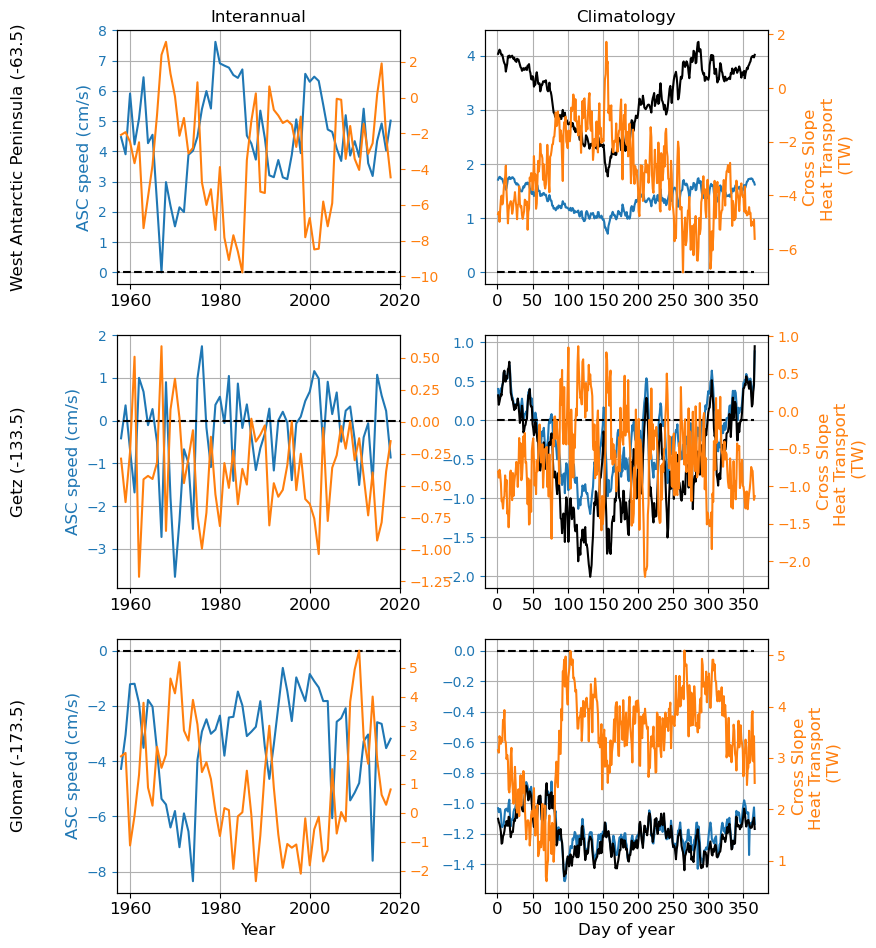

In [24]:
## 3x2 instead
fontsize=12

fig = plt.figure(figsize=(12*0.7, 16*0.7))

# Create a GridSpec for a 3x4 grid
grid = gs.GridSpec(nrows=3, ncols=2, figure=fig)
grid.update(hspace=0.2, wspace=0.3)  # Adjust vertical and horizontal spacing

# Initialize a list to store axes
axes = []

# Loop through the 3x4 grid to create subplots
for j in range(inds_regions.size):  # Loop over rows

    i = inds_regions[j]

    ax3 = fig.add_subplot(grid[j,0])
    ax4 = fig.add_subplot(grid[j,1])
    ###################
    
    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    ax3.plot([1956,2024],[0,0],\
             linestyle='--',color='black')
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    #if j == 0:    
    ax3.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
    #    ax3_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
        ax3.set_xlabel('Year',fontsize=fontsize)

    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid()
    ax3.set_xlim(1957,2020)
    ax3.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange
    
    ax3.text(-0.35,0.5, regions[i] + ' (' + str(longitude_slices[i]) + ')', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)

    ################
    
    ax4_HT=ax4.twinx()
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    #u_along_watercolumn_clima
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,u_along_watercolumn_clima.sel(lon_bins=longitude_slices[i])*100,label='ASC_full',color='k')
    ax4.plot([0,365],[0,0],\
             linestyle='--',color='black')
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    '''
    if j == 0:    
        ax4.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
        '''

    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
        ax4.set_xlabel('Day of year',fontsize=fontsize)

    ax4_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
    # ax4.set_xticks(ticks=np.arange(1960,2021,10),labels=np.arange(1960,2021,10), fontsize=14)
    ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50),fontsize=fontsize)
    #ax4.set_xlim(1,12)
    ax4.grid()
    # Set tick colors
    ax4.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange

    if j == 0 :
        ax3.set_title( 'Interannual', fontsize=fontsize)#, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
        ax4.set_title('Climatology', fontsize=fontsize)#, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)

plt.tight_layout()
#figure_path = figdir+'selected_time_series.png'
#plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
# Show the plots
plt.show()

In [25]:
str(np.round(r_sq_annual_10deg.sel(lon_bins = longitude_slices[i]).values,3))

'0.645'

In [26]:


longitude_slices[4]=-173.5
regions[4]= 'Glomar'

In [27]:
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize

In [28]:
# Extract your x and y data
def plotcolors_ASC_annual(ax,x,y,norm0,cmap0):
    x = np.linspace(x.min().values,x.max().values,3001)
    y=y.interp(year=x)
    # Color values come from the same data
    color_values = y  # You want the color to reflect the same values being plotted
    
    # Build line segments for LineCollection
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    cmap_0 = cm.get_cmap(cmap0, 256)
    # Normalize and set colormap
    norm = Normalize(vmin=-norm0, vmax=norm0)  # handle NaNs if present
    lc = LineCollection(segments, cmap=cmap_0, norm=norm)
    lc.set_array(color_values)
    lc.set_linewidth(2.5)
    lc.set_zorder(0) 
    # Plot

    ax.add_collection(lc)
    
    # Set axis limits
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(np.nanmin(y), np.nanmax(y))
    
    # Optional colorbar
    #cbar = plt.colorbar(lc, ax=ax)
    #cbar.set_label('CDW Volume Transport (×100)')  # customize label
    
    # Add labels or title if needed
def plotcolors_CSHT_annual(ax,x,y,norm0,cmap0):
    x = np.linspace(x.min().values,x.max().values,3001)
    y=y.interp(year=x)
    # Color values come from the same data
    color_values = y  # You want the color to reflect the same values being plotted
    
    # Build line segments for LineCollection
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    cmap_0 = cm.get_cmap(cmap0, 256)
    # Normalize and set colormap
    
    #norm = Normalize(vmin=(y.min()*0.8).values, vmax=(y.max()*0.8).values)  # handle NaNs if 
    norm = Normalize(vmin=(-y.max()*0.8).values, vmax=(y.max()*0.8).values) 
    lc = LineCollection(segments, cmap=cmap_0, norm=norm)
    lc.set_array(color_values)
    lc.set_linewidth(2.5)
    lc.set_zorder(0) 
    # Plot

    ax.add_collection(lc)
    
    # Set axis limits
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(np.nanmin(y), np.nanmax(y))
    
    # Optional colorbar
    #cbar = plt.colorbar(lc, ax=ax)
    #cbar.set_label('CDW Volume Transport (×100)')  # customize label
    
    # Add labels or title if needed
    
def plotcolors_ASC_clima(ax,x,y,norm0,cmap0):
    x = np.linspace(x.min().values,x.max().values,3001)
    y=y.interp(dayofyear=x)
    # Color values come from the same data
    color_values = y  # You want the color to reflect the same values being plotted
    
    # Build line segments for LineCollection
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    cmap_0 = cm.get_cmap(cmap0, 256)
    # Normalize and set colormap
    norm = Normalize(vmin=-norm0, vmax=norm0)  # handle NaNs if present
    lc = LineCollection(segments, cmap=cmap_0, norm=norm)
    lc.set_array(color_values)
    lc.set_linewidth(2.5)
    lc.set_zorder(0) 
    # Plot

    ax.add_collection(lc)
    
    # Set axis limits
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(np.nanmin(y), np.nanmax(y))
    
    # Optional colorbar
    #cbar = plt.colorbar(lc, ax=ax)
    #cbar.set_label('CDW Volume Transport (×100)')  # customize label
    
    # Add labels or title if needed
def plotcolors_CSHT_clima(ax,x,y,norm0,cmap0):
    x = np.linspace(x.min().values,x.max().values,3001)
    y=y.interp(dayofyear=x)
    # Color values come from the same data
    color_values = y  # You want the color to reflect the same values being plotted
    
    # Build line segments for LineCollection
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    cmap_0 = cm.get_cmap(cmap0, 256)
    # Normalize and set colormap
    #norm = Normalize(vmin=(y.min()*0.8).values, vmax=(y.max()*0.8).values)  # handle NaNs if present
    norm = Normalize(vmin=(-y.max()*0.8).values, vmax=(y.max()*0.8).values)
    lc = LineCollection(segments, cmap=cmap_0, norm=norm)
    lc.set_array(color_values)
    lc.set_linewidth(2.5)
    lc.set_zorder(0) 
    # Plot

    ax.add_collection(lc)
    
    # Set axis limits
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(np.nanmin(y), np.nanmax(y))
    
    # Optional colorbar
    #cbar = plt.colorbar(lc, ax=ax)
    #cbar.set_label('CDW Volume Transport (×100)')  # customize label
    
    # Add labels or title if needed


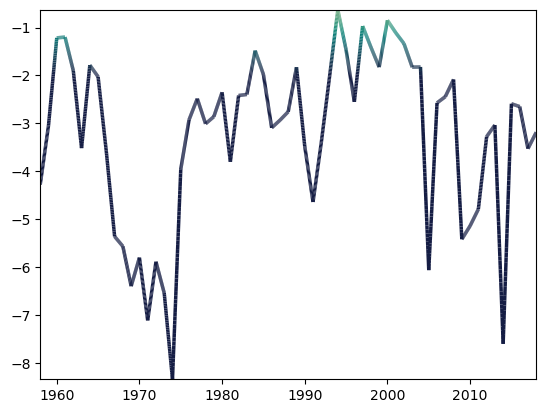

In [29]:
fig, ax = plt.subplots()
x = U_along_annual_binned_CDW_volav.year  # Assuming time is your x-axis
y = (U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i]) * 100)
#np.linspace(x.min().values,x.max().values,2001)
plotcolors_ASC_annual(ax,x,y,np.abs(2),cmocean.curl)

In [30]:
#yaxis for stacked plots
#plots:     |"a"|"b"  |"c" |"d"  |"e" |"f" |
maxASC  =  [8   ,2   ,0    ,2    ,1   ,-0.8]
minASC  =  [-9  ,-10  ,-18  ,-2 ,-4    ,-2.5  ]
maxPHT  =  [16  ,3   ,15   ,12    ,5   ,13  ]
minPHT  =  [-10 ,-1.5,-2.5 ,-7 ,-2.2,0   ]

#yticks for stacked plots
yticks_ASC = [[0,4,8] , [-2,0,2] , [-8,-4,0] , [0,1,2] , [-1,0,1] , [-1.6,-1.2,-0.8]]
yticks_PHT = [[-10,-5,0,5] , [-1,-0.5,0,0.5] , [-2,0,2,4,6] , [-8,-4,0] , [-2,-1,0,1] , [0,3,6]]

In [31]:
#years wuth eastward anomalies extracted from the compositess
yearsinds=[[1963, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1999, 2001] ,\
[1962, 1968, 1975, 1976, 1982, 1984, 2001, 2002, 2004, 2015],\
[1960, 1961, 1989, 1994, 1995, 1997, 2000, 2001, 2002, 2003]]

In [32]:
seasonal_xticks = [  0    , 31    , 59    , 90    , 119   , 150   ,  180  ,  211  , 242   ,  272  ,  304  , 334   ]
seasonal_xlabels= ['1/Jan','1/Feb','1/Mar','1/Apr','1/May','1/Jun','1/Jul','1/Aug','1/Sep','1/Oct','1/Nov','1/Dec']

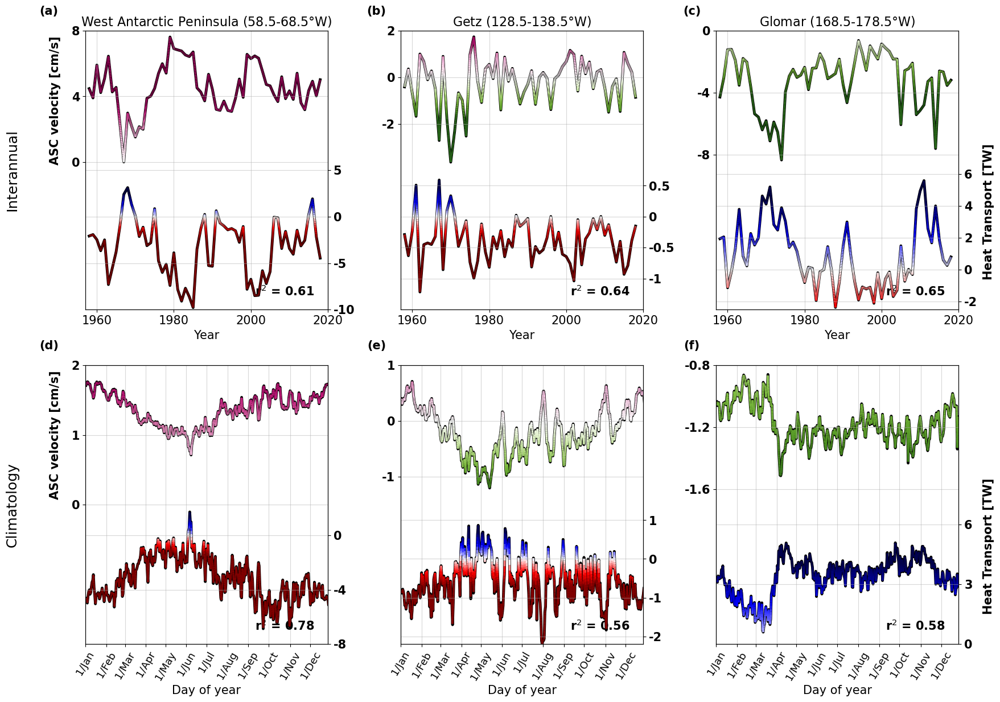

In [33]:
### MOST UPDATED FIGURE 4
## bracket (a) in bold - outside of the box
fontsize=15


fig = plt.figure(figsize=(22*0.9, 14))
ASC_color='black'
CSHT_color='black'
outlinethickness=3.5
# Create a GridSpec for a 3x4 grid
grid = gs.GridSpec(nrows=2, ncols=3, figure=fig)
grid.update(hspace=0.2, wspace=0.3)  # Adjust vertical and horizontal spacing

# Initialize a list to store axes
axes = []

# Loop through the 3x4 grid to create subplots
for j in range(inds_regions.size):  # Loop over rows

    i = inds_regions[j]

    ax3 = fig.add_subplot(grid[0, j])
    ax4 = fig.add_subplot(grid[1, j])
    ###################
    ax3.set_title(regions[i] + ' (' + str(-longitude_slices[i]-5) + '-' \
                  + str(-longitude_slices[i]+5) + '$\degree$W)',fontsize=16)

    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC',linewidth=outlinethickness,zorder=0,color=ASC_color)
    x=U_along_annual_binned_CDW_volav.year
    y=(U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100)
    plotcolors_ASC_annual(ax3,x,y,(0.5*np.max(np.abs(y))).values,'PiYG_r')#np.max(np.abs(y)).values
    #ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_DSW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='DSW',color='k')
    # ax3.plot([1956,2024],[0,0],\
    #          linestyle='--',color='tab:blue')
    ax3.set_ylim([minASC[j],maxASC[j]])
    
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color=CSHT_color,linewidth=outlinethickness,zorder=0)
    x=U_along_annual_binned_CDW_volav.year
    y=(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12)
    plotcolors_CSHT_annual(ax3_HT,x,y,np.max(np.abs(y)).values,'seismic_r')#'Reds_r'
    # ax3_HT.plot([1956,2024],[0,0],\
    #          linestyle='--',color='tab:orange')
    ax3_HT.set_ylim([minPHT[j],maxPHT[j]])
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    if j == 0:
        ax3.set_ylabel('ASC velocity [cm/s]',fontsize=fontsize,color=ASC_color, fontweight = 'bold')
        ax3.yaxis.set_label_coords(-0.1, 0.75)
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
        ax3_HT.set_ylabel('Heat Transport [TW]',fontsize=fontsize,color=CSHT_color, fontweight = 'bold')
        ax3_HT.yaxis.set_label_coords(1.1, 0.35)
    
    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid(alpha = 0.5)
    ax3_HT.grid(alpha = 0.5)
    ax3.set_xlim(1957,2020)
    ax3.set_xlabel('Year',fontsize=fontsize)
    ax3.tick_params(axis='y', colors=ASC_color,labelsize=fontsize)  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors=CSHT_color,labelsize=fontsize) # Right y-axis ticks and labels in orange
    # ax3.plot([yearsinds[j],yearsinds[j]],[np.array(yearsinds[j])*0-30,np.array(yearsinds[j])*0+30],':',color='silver',zorder=0)

    if j == 0:
        ax3.set_yticks(ax3.get_yticks()[1::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])
    if j == 1:
        ax3.set_yticks(ax3.get_yticks()[::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])        
    if j == 2:
        ax3_HT.set_yticks(ax3_HT.get_yticks()[1::2])

    ax3.set_yticklabels(ax3.get_yticks(), weight='bold')
    ax3_HT.set_yticklabels(ax3_HT.get_yticks(), weight='bold')
    ax3.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_annual_10deg.sel(lon_bins = longitude_slices[i]).values,2)), \
             (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold', zorder = 6e5)  
    ax3.set_yticks(ticks=yticks_ASC[j],labels=yticks_ASC[j])
    ax3_HT.set_yticks(ticks=yticks_PHT[j],labels=yticks_PHT[j])
    ################
    
    ax4_HT=ax4.twinx()
    ax4.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_clim_daily.sel(lon_bins = longitude_slices[i]).values,2)), \
                 (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold', zorder = 6e5)    
    
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC',linewidth=outlinethickness,zorder=0,color=ASC_color)
    #ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_DSW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='DSW',color='k')
    x=U_along_clima_binned_CDW_volav.dayofyear
    y=(U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100)
    plotcolors_ASC_clima(ax4,x,y,(1.1*np.max(np.abs(y))).values,'PiYG_r')#np.max(np.abs(y)).values
    # ax4.plot([0,365],[0,0],\
    #          linestyle='--',color='tab:blue')
    ax4.set_ylim([minASC[3+j],maxASC[3+j]])
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color=CSHT_color,linewidth=outlinethickness,zorder=0)
    x=U_along_clima_binned_CDW_volav.dayofyear
    y=(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12)
    plotcolors_CSHT_clima(ax4_HT,x,y,np.max(np.abs(y)).values,'seismic_r')#Reds_r
    # ax4_HT.plot([0,365],[0,0],\
    #          linestyle='--',color='tab:orange')
    ax4_HT.set_ylim([minPHT[3+j],maxPHT[3+j]])

    if j == 0:    
        ax4.set_ylabel('ASC velocity [cm/s]',fontsize=fontsize,color=ASC_color, fontweight = 'bold')
        ax4.yaxis.set_label_coords(-0.1, 0.75)
 
    if j == inds_regions.size-1:
        ax4_HT.set_ylabel('Heat Transport [TW]',fontsize=fontsize,color=CSHT_color, fontweight = 'bold')
        ax4_HT.yaxis.set_label_coords(1.1, 0.35)
    ax4.set_xlabel('Day of year',fontsize=fontsize)
    #ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50),fontsize=fontsize)
    ax4_HT.set_xticks(ticks=[],labels=[])
    ax4.grid(alpha = 0.5)
    ax4_HT.grid(alpha = 0.5)
    # Set tick colors
    ax4.tick_params(axis='y', colors=ASC_color,labelsize=fontsize) # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors=CSHT_color,labelsize=fontsize)  # Right y-axis ticks and labels in orange
    ax4_HT.set_xlim(0,360)
    ax4.set_xticks(ticks=seasonal_xticks)
    ax4.set_xticklabels(labels=seasonal_xlabels, fontsize=fontsize-2, rotation=60, ha='center')
    ax4.tick_params(axis='x',labelsize=fontsize-2, labelrotation=60)


    if j == 0:
        ax4_HT.set_yticks(ax4_HT.get_yticks()[:])
        ax4.set_yticks(ax4.get_yticks()[1::2])
    if j == 1:
        ax4.set_yticks(ax4.get_yticks()[1::2])
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])
    if j == 2:
        ax4.set_yticks(ax4.get_yticks()[::2])    
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])


    ax4.set_yticklabels(np.round(ax4.get_yticks(),1), weight='bold')
    ax4_HT.set_yticklabels(ax4_HT.get_yticks(), weight='bold')
    ax4.set_yticks(ticks=yticks_ASC[3+j],labels=yticks_ASC[3+j])
    ax4_HT.set_yticks(ticks=yticks_PHT[3+j],labels=yticks_PHT[3+j])

ax3.text(-2.9,0.5, 'Interannual', fontsize=18, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
ax4.text(-2.9,0.5, 'Climatology', fontsize=18, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)

ax3.text(-2.75,1.07, '(a)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-1.4,1.07, '(b)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-0.1,1.07, '(c)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-2.75,1.07, '(d)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-1.4,1.07, '(e)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-0.1,1.07, '(f)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')

plt.tight_layout()
figure_path = '/g/data/x77/wf4500/ASC_project/analysis_figs/selected_time_series_aug12_noblacklines.png'
plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
## Show the plots
plt.tight_layout()
plt.show()


How does Mertz look like?

In [34]:
#lets try now with mertz

longitude_slices[4]=-223.5
regions[4]= 'Mertz'

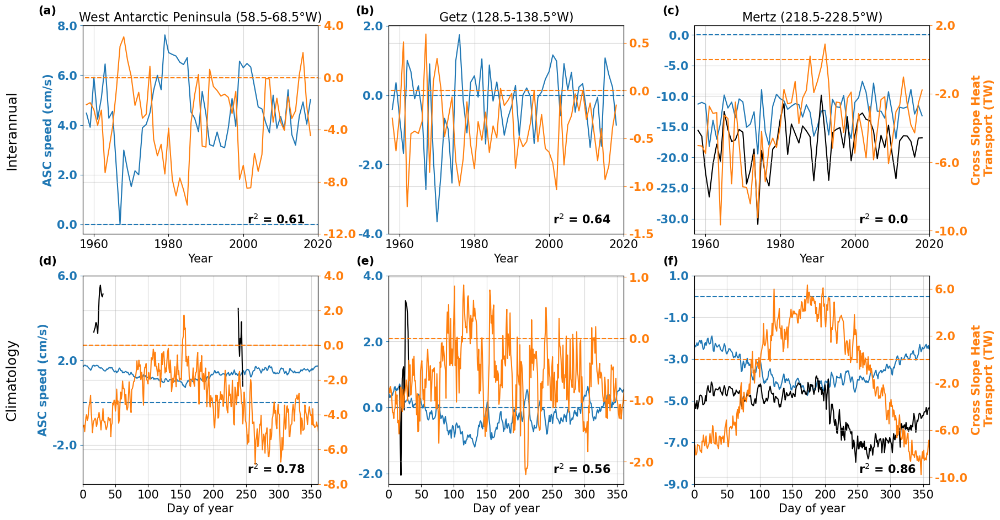

In [35]:
## bracket (a) in bold - outside of the box
fontsize=15

fig = plt.figure(figsize=(22*0.9, 12*0.9))

# Create a GridSpec for a 3x4 grid
grid = gs.GridSpec(nrows=2, ncols=3, figure=fig)
grid.update(hspace=0.2, wspace=0.3)  # Adjust vertical and horizontal spacing

# Initialize a list to store axes
axes = []

# Loop through the 3x4 grid to create subplots
for j in range(inds_regions.size):  # Loop over rows

    i = inds_regions[j]

    ax3 = fig.add_subplot(grid[0, j])
    ax4 = fig.add_subplot(grid[1, j])
    ###################
    ax3.set_title(regions[i] + ' (' + str(-longitude_slices[i]-5) + '-' \
                  + str(-longitude_slices[i]+5) + '$\degree$W)',fontsize=16)

    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_DSW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='DSW',color='k')
    ax3.plot([1956,2024],[0,0],\
             linestyle='--',color='tab:blue')
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    ax3_HT.plot([1956,2024],[0,0],\
             linestyle='--',color='tab:orange')
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    if j == 0:    
        ax3.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue', fontweight = 'bold')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
        ax3_HT.set_ylabel('Cross Slope Heat\n Transport (TW)',fontsize=fontsize,color='tab:orange', fontweight = 'bold')
    
    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid(alpha = 0.5)
    ax3_HT.grid(alpha = 0.5)
    ax3.set_xlim(1957,2020)
    ax3.set_xlabel('Year',fontsize=fontsize)
    ax3.tick_params(axis='y', colors='tab:blue',labelsize=fontsize)  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors='tab:orange',labelsize=fontsize) # Right y-axis ticks and labels in orange

    if j == 0:
        ax3.set_yticks(ax3.get_yticks()[1::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])
    if j == 1:
        ax3.set_yticks(ax3.get_yticks()[::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])        
    if j == 2:
        ax3_HT.set_yticks(ax3_HT.get_yticks()[1::2])

    ax3.set_yticklabels(ax3.get_yticks(), weight='bold')
    ax3_HT.set_yticklabels(ax3_HT.get_yticks(), weight='bold')
    ax3.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_annual_10deg.sel(lon_bins = longitude_slices[i]).values,2)), \
             (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold', zorder = 20)    
    
    ################
    
    ax4_HT=ax4.twinx()
    ax4.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_clim_daily.sel(lon_bins = longitude_slices[i]).values,2)), \
                 (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold')    
    
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    ax4.plot(U_along_clima_binned_DSW_volav.dayofyear,U_along_clima_binned_DSW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='DSW',color='k')
    ax4.plot([0,365],[0,0],\
             linestyle='--',color='tab:blue')
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    ax4_HT.plot([0,365],[0,0],\
             linestyle='--',color='tab:orange')

    if j == 0:    
        ax4.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue', fontweight = 'bold')
 
    if j == inds_regions.size-1:
        ax4_HT.set_ylabel('Cross Slope Heat\n Transport (TW)',fontsize=fontsize,color='tab:orange', fontweight = 'bold')
    ax4.set_xlabel('Day of year',fontsize=fontsize)
    ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50),fontsize=fontsize)
    ax4.grid(alpha = 0.5)
    ax4_HT.grid(alpha = 0.5)
    # Set tick colors
    ax4.tick_params(axis='y', colors='tab:blue',labelsize=fontsize) # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors='tab:orange',labelsize=fontsize)  # Right y-axis ticks and labels in orange
    ax4_HT.set_xlim(0,360)


    if j == 0:
        ax4_HT.set_yticks(ax4_HT.get_yticks()[:])
        ax4.set_yticks(ax4.get_yticks()[1::2])
    if j == 1:
        ax4.set_yticks(ax4.get_yticks()[1::2])
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])
    if j == 2:
        ax4.set_yticks(ax4.get_yticks()[::2])    
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])


    ax4.set_yticklabels(np.round(ax4.get_yticks(),1), weight='bold')
    ax4_HT.set_yticklabels(ax4_HT.get_yticks(), weight='bold')

ax3.text(-2.9,0.5, 'Interannual', fontsize=18, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
ax4.text(-2.9,0.5, 'Climatology', fontsize=18, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)

ax3.text(-2.75,1.07, '(a)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-1.4,1.07, '(b)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-0.1,1.07, '(c)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-2.75,1.07, '(d)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-1.4,1.07, '(e)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-0.1,1.07, '(f)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')

plt.tight_layout()
#figure_path = figdir+'selected_time_series.png'
#plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
# Show the plots
plt.tight_layout()
plt.show()


## Part 2 -  No Zonal Convergence

I am curios to know if the timeseries are showing these Northward heat transports because of the zonal convergence. Lemme do a sensitivity test **without the zonal convergence**

In [36]:
# Load CSHT field annual
#CSHT_along = xr.open_mfdataset('/g/data/hh5/tmp/access-om/fbd581/ASC_project/Lon_binning/CSHT_ZC_potrho0_10degBins.nc')
CSHT_along_noZC = xr.open_mfdataset('/g/data/e14/fbd581/ASC_project/Lon_binning/CSHT_potrho0_10degBins.nc')
# resample monthly:
CSHT_along_monthly_noZC = CSHT_along_noZC.resample(time='1M').mean()

# apply age mask to select out CDW layer:
CSHT_months_binned_CDW_noZC = (age_mask_monthly.CDW_mask * CSHT_along_monthly_noZC )

# annual averaging and sum over layers:
CSHT_annual_binned_CDW_noZC = CSHT_months_binned_CDW_noZC.groupby('time.year').mean('time').sum(dim = 'potrho0')

# climatological averaging:
CSHT_along_daily_noZC = CSHT_along_noZC

# apply age mask to select out CDW layer:
CSHT_months_binned_CDW_noZC = (age_mask_daily.CDW_mask * CSHT_along_daily_noZC )

# sum over layers:
CSHT_clima_binned_CDW_noZC = CSHT_months_binned_CDW_noZC.sum(dim = 'potrho0')

# compute seasonal climatology:
CSHT_clima_binned_CDW_noZC = CSHT_clima_binned_CDW_noZC.groupby('time.dayofyear').mean('time')
CSHT_clima_binned_CDW_noZC = CSHT_clima_binned_CDW_noZC.load()

In [37]:
factor = (CSHT_along.CSHT_ZC_lon_binned.sum('potrho0').mean('time').sum('lon_bins')/CSHT_along_noZC.CSHT_lon_binned.sum('potrho0').mean('time').sum('lon_bins')).values


First with Glomar

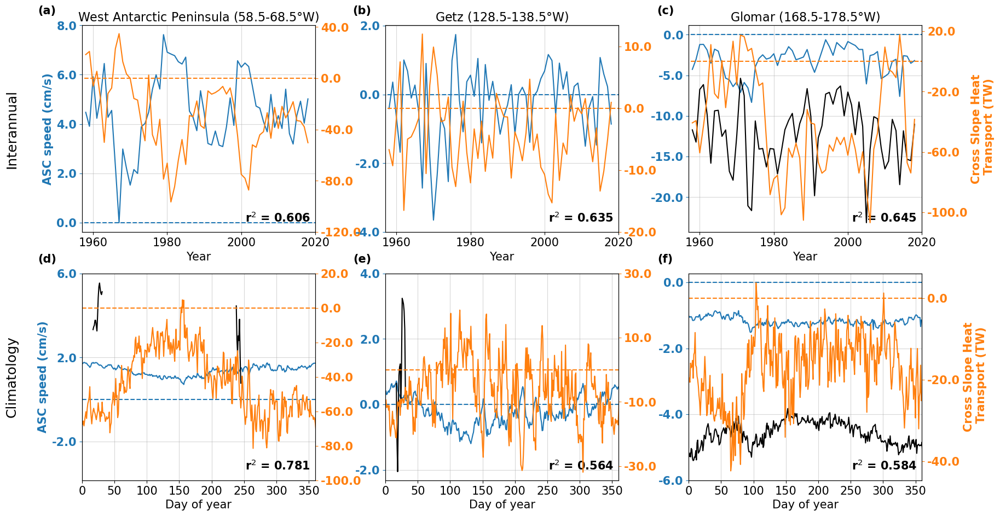

In [38]:
longitude_slices[4]=-173.5
regions[4]= 'Glomar'
## bracket (a) in bold - outside of the box
fontsize=15

fig = plt.figure(figsize=(22*0.9, 12*0.9))

# Create a GridSpec for a 3x4 grid
grid = gs.GridSpec(nrows=2, ncols=3, figure=fig)
grid.update(hspace=0.2, wspace=0.3)  # Adjust vertical and horizontal spacing

# Initialize a list to store axes
axes = []

# Loop through the 3x4 grid to create subplots
for j in range(inds_regions.size):  # Loop over rows

    i = inds_regions[j]

    ax3 = fig.add_subplot(grid[0, j])
    ax4 = fig.add_subplot(grid[1, j])
    ###################
    ax3.set_title(regions[i] + ' (' + str(-longitude_slices[i]-5) + '-' \
                  + str(-longitude_slices[i]+5) + '$\degree$W)',fontsize=16)

    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_DSW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='DSW',color='k')
    ax3.plot([1956,2024],[0,0],\
             linestyle='--',color='tab:blue')
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW_noZC.CSHT_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    ax3_HT.plot([1956,2024],[0,0],\
             linestyle='--',color='tab:orange')
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    if j == 0:    
        ax3.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue', fontweight = 'bold')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
        ax3_HT.set_ylabel('Cross Slope Heat\n Transport (TW)',fontsize=fontsize,color='tab:orange', fontweight = 'bold')
    
    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid(alpha = 0.5)
    ax3.set_xlim(1957,2020)
    ax3.set_xlabel('Year',fontsize=fontsize)
    ax3.tick_params(axis='y', colors='tab:blue',labelsize=fontsize)  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors='tab:orange',labelsize=fontsize) # Right y-axis ticks and labels in orange

    if j == 0:
        ax3.set_yticks(ax3.get_yticks()[1::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])
    if j == 1:
        ax3.set_yticks(ax3.get_yticks()[::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])        
    if j == 2:
        ax3_HT.set_yticks(ax3_HT.get_yticks()[1::2])

    ax3.set_yticklabels(ax3.get_yticks(), weight='bold')
    ax3_HT.set_yticklabels(ax3_HT.get_yticks(), weight='bold')
    ax3.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_annual_10deg.sel(lon_bins = longitude_slices[i]).values,3)), \
             (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold', zorder = 20)    
    
    ################
    
    ax4_HT=ax4.twinx()
    ax4.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_clim_daily.sel(lon_bins = longitude_slices[i]).values,3)), \
                 (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold')    
    
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_DSW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='DSW',color='k')
    ax4.plot([0,365],[0,0],\
             linestyle='--',color='tab:blue')
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW_noZC.CSHT_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    ax4_HT.plot([0,365],[0,0],\
             linestyle='--',color='tab:orange')

    if j == 0:    
        ax4.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue', fontweight = 'bold')
 
    if j == inds_regions.size-1:
        ax4_HT.set_ylabel('Cross Slope Heat\n Transport (TW)',fontsize=fontsize,color='tab:orange', fontweight = 'bold')
    ax4.set_xlabel('Day of year',fontsize=fontsize)
    ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50),fontsize=fontsize)
    ax4.grid(alpha = 0.5)
    # Set tick colors
    ax4.tick_params(axis='y', colors='tab:blue',labelsize=fontsize) # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors='tab:orange',labelsize=fontsize)  # Right y-axis ticks and labels in orange
    ax4_HT.set_xlim(0,360)


    if j == 0:
        ax4_HT.set_yticks(ax4_HT.get_yticks()[:])
        ax4.set_yticks(ax4.get_yticks()[1::2])
    if j == 1:
        ax4.set_yticks(ax4.get_yticks()[1::2])
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])
    if j == 2:
        ax4.set_yticks(ax4.get_yticks()[::2])    
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])


    ax4.set_yticklabels(np.round(ax4.get_yticks(),1), weight='bold')
    ax4_HT.set_yticklabels(ax4_HT.get_yticks(), weight='bold')

ax3.text(-2.9,0.5, 'Interannual', fontsize=18, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
ax4.text(-2.9,0.5, 'Climatology', fontsize=18, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)

ax3.text(-2.75,1.07, '(a)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-1.4,1.07, '(b)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-0.1,1.07, '(c)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-2.75,1.07, '(d)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-1.4,1.07, '(e)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-0.1,1.07, '(f)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')

plt.tight_layout()
#figure_path = figdir+'selected_time_series.png'
#plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
# Show the plots
plt.tight_layout()
plt.show()

ok, Although the shape is the same, the CSHT is now negative for glomar, which makes much more sense now

Let's look at Mertz now

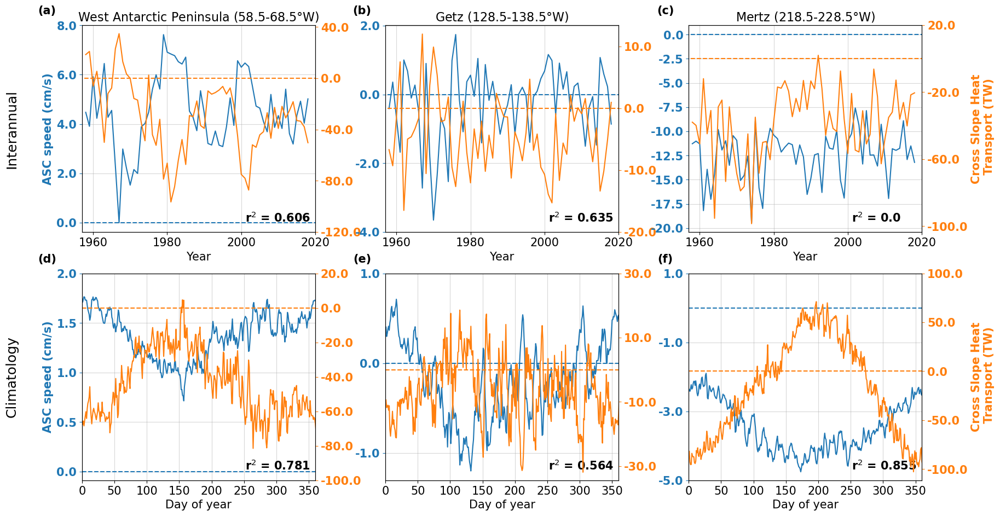

In [39]:
#lets try now with mertz

longitude_slices[4]=-223.5
regions[4]= 'Mertz'
## bracket (a) in bold - outside of the box
fontsize=15

fig = plt.figure(figsize=(22*0.9, 12*0.9))

# Create a GridSpec for a 3x4 grid
grid = gs.GridSpec(nrows=2, ncols=3, figure=fig)
grid.update(hspace=0.2, wspace=0.3)  # Adjust vertical and horizontal spacing

# Initialize a list to store axes
axes = []

# Loop through the 3x4 grid to create subplots
for j in range(inds_regions.size):  # Loop over rows

    i = inds_regions[j]

    ax3 = fig.add_subplot(grid[0, j])
    ax4 = fig.add_subplot(grid[1, j])
    ###################
    ax3.set_title(regions[i] + ' (' + str(-longitude_slices[i]-5) + '-' \
                  + str(-longitude_slices[i]+5) + '$\degree$W)',fontsize=16)

    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    #ax3.plot(U_along_annual_binned_CDW_volav.year,u_along_surf_annual.sel(lon_bins=longitude_slices[i])*100,label='ASC_surf',color='k')
    ax3.plot([1956,2024],[0,0],\
             linestyle='--',color='tab:blue')
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW_noZC.CSHT_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    ax3_HT.plot([1956,2024],[0,0],\
             linestyle='--',color='tab:orange')
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    if j == 0:    
        ax3.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue', fontweight = 'bold')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
        ax3_HT.set_ylabel('Cross Slope Heat\n Transport (TW)',fontsize=fontsize,color='tab:orange', fontweight = 'bold')
    
    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid(alpha = 0.5)
    ax3.set_xlim(1957,2020)
    ax3.set_xlabel('Year',fontsize=fontsize)
    ax3.tick_params(axis='y', colors='tab:blue',labelsize=fontsize)  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors='tab:orange',labelsize=fontsize) # Right y-axis ticks and labels in orange

    if j == 0:
        ax3.set_yticks(ax3.get_yticks()[1::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])
    if j == 1:
        ax3.set_yticks(ax3.get_yticks()[::2])
        ax3_HT.set_yticks(ax3_HT.get_yticks()[::2])        
    if j == 2:
        ax3_HT.set_yticks(ax3_HT.get_yticks()[1::2])

    ax3.set_yticklabels(ax3.get_yticks(), weight='bold')
    ax3_HT.set_yticklabels(ax3_HT.get_yticks(), weight='bold')
    ax3.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_annual_10deg.sel(lon_bins = longitude_slices[i]).values,3)), \
             (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold', zorder = 20)    
    
    ################
    
    ax4_HT=ax4.twinx()
    ax4.annotate( 'r$^{2}$ = ' + str(np.round(r_sq_clim_daily.sel(lon_bins = longitude_slices[i]).values,3)), \
                 (0.7,0.05), xycoords='axes fraction', fontsize = fontsize, fontweight = 'bold')    
    
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    #ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,u_along_surf_clima.sel(lon_bins=longitude_slices[i])*100,label='ASC_surf',color='k')
    ax4.plot([0,365],[0,0],\
             linestyle='--',color='tab:blue')
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW_noZC.CSHT_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    ax4_HT.plot([0,365],[0,0],\
             linestyle='--',color='tab:orange')

    if j == 0:    
        ax4.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue', fontweight = 'bold')
 
    if j == inds_regions.size-1:
        ax4_HT.set_ylabel('Cross Slope Heat\n Transport (TW)',fontsize=fontsize,color='tab:orange', fontweight = 'bold')
    ax4.set_xlabel('Day of year',fontsize=fontsize)
    ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50),fontsize=fontsize)
    ax4.grid(alpha = 0.5)
    # Set tick colors
    ax4.tick_params(axis='y', colors='tab:blue',labelsize=fontsize) # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors='tab:orange',labelsize=fontsize)  # Right y-axis ticks and labels in orange
    ax4_HT.set_xlim(0,360)


    if j == 0:
        ax4_HT.set_yticks(ax4_HT.get_yticks()[:])
        ax4.set_yticks(ax4.get_yticks()[1::2])
    if j == 1:
        ax4.set_yticks(ax4.get_yticks()[1::2])
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])
    if j == 2:
        ax4.set_yticks(ax4.get_yticks()[::2])    
        ax4_HT.set_yticks(ax4_HT.get_yticks()[1::2])


    ax4.set_yticklabels(np.round(ax4.get_yticks(),1), weight='bold')
    ax4_HT.set_yticklabels(ax4_HT.get_yticks(), weight='bold')

ax3.text(-2.9,0.5, 'Interannual', fontsize=18, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
ax4.text(-2.9,0.5, 'Climatology', fontsize=18, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)

ax3.text(-2.75,1.07, '(a)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-1.4,1.07, '(b)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax3.text(-0.1,1.07, '(c)', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-2.75,1.07, '(d)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-1.4,1.07, '(e)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')
ax4.text(-0.1,1.07, '(f)', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', fontweight = 'bold')

plt.tight_layout()
#figure_path = figdir+'selected_time_series.png'
#plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
# Show the plots
plt.tight_layout()
plt.show()

How does the CSHT mean in each bin look like with and without ZC?

Text(0.5, 1.0, 'Effect of Zonal Convergence on climatology of heat transport')

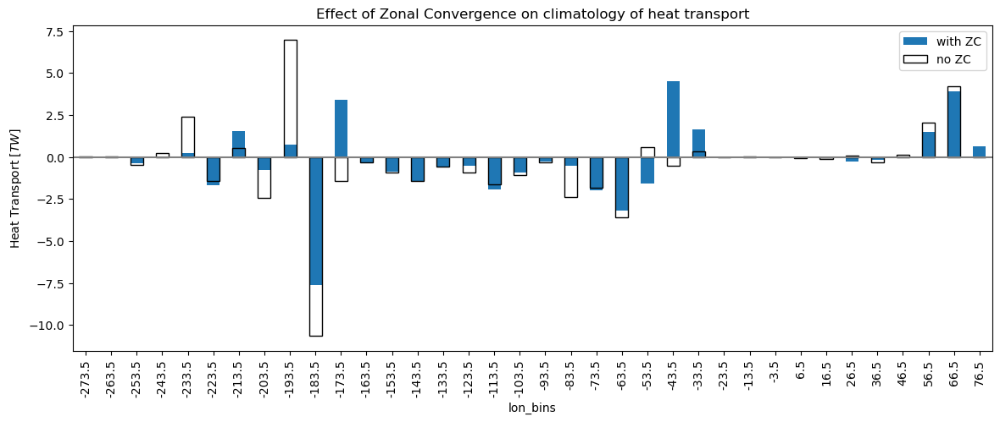

In [40]:
plt.figure(figsize=(14,5))
plt.plot([-280,80],[0,0],color='grey')
(1e-12*CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.mean('dayofyear')).to_series().plot.bar(label='with ZC')
(1e-12*factor*CSHT_clima_binned_CDW_noZC.CSHT_lon_binned.mean('dayofyear')).to_series().plot.bar(color='none',edgecolor='black',label='no ZC')
plt.legend()
plt.ylabel('Heat Transport [$TW$]')
plt.title('Effect of Zonal Convergence on climatology of heat transport')

Text(0.5, 1.0, 'Effect of Zonal Convergence on annual mean of heat transport')

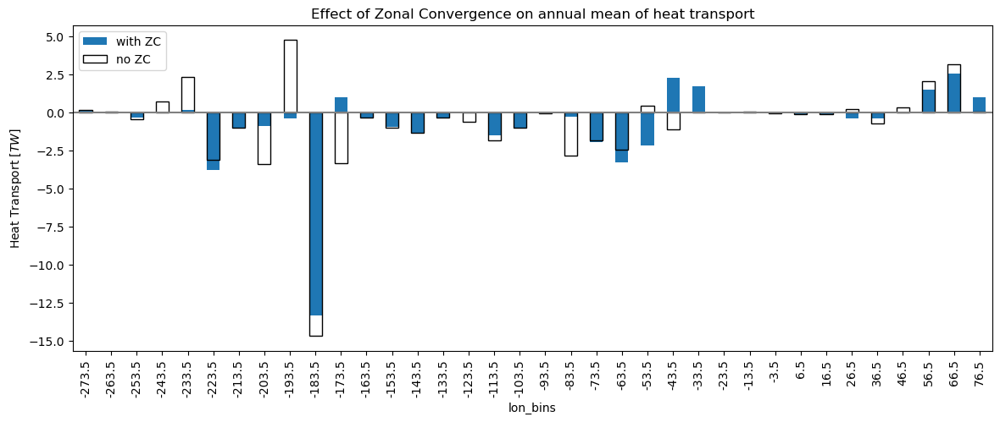

In [41]:
plt.figure(figsize=(14,5))
plt.plot([-280,80],[0,0],color='grey')
(1e-12*CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.mean('year')).to_series().plot.bar(label='with ZC')
(1e-12*factor*CSHT_annual_binned_CDW_noZC.CSHT_lon_binned.mean('year')).to_series().plot.bar(color='none',edgecolor='black',label='no ZC')
plt.legend()
plt.ylabel('Heat Transport [$TW$]')
plt.title('Effect of Zonal Convergence on annual mean of heat transport')

What about their variability? how correlated is the CSHT with and without ZC? if well correlated then it doesnt matter, if not then it matters.

In [42]:
import scipy.stats as stats

In [43]:
CSHT_annual_binned_CDW.load()
CSHT_annual_binned_CDW_noZC.load()

<xarray.Dataset> Size: 18kB
Dimensions:          (year: 61, lon_bins: 36)
Coordinates:
  * lon_bins         (lon_bins) float64 288B -273.5 -263.5 -253.5 ... 66.5 76.5
  * year             (year) int64 488B 1958 1959 1960 1961 ... 2016 2017 2018
Data variables:
    CSHT_lon_binned  (year, lon_bins) float64 18kB 8.464e+12 ... 1.182e+12

In [44]:
clima_correlations_per_bin=CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.mean('dayofyear')*0
annual_correlations_per_bin=CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.mean('dayofyear')*0
for i in range(35):
    clima_correlations_per_bin[i] = stats.linregress(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.isel(lon_bins=i), factor*CSHT_clima_binned_CDW_noZC.CSHT_lon_binned.isel(lon_bins=i)).rvalue**2
    annual_correlations_per_bin[i] = stats.linregress(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.isel(lon_bins=i), factor*CSHT_annual_binned_CDW_noZC.CSHT_lon_binned.isel(lon_bins=i)).rvalue**2


Text(0.5, 1.0, 'CSHT vs CSHT+ZC correlation for seasonal timeseries')

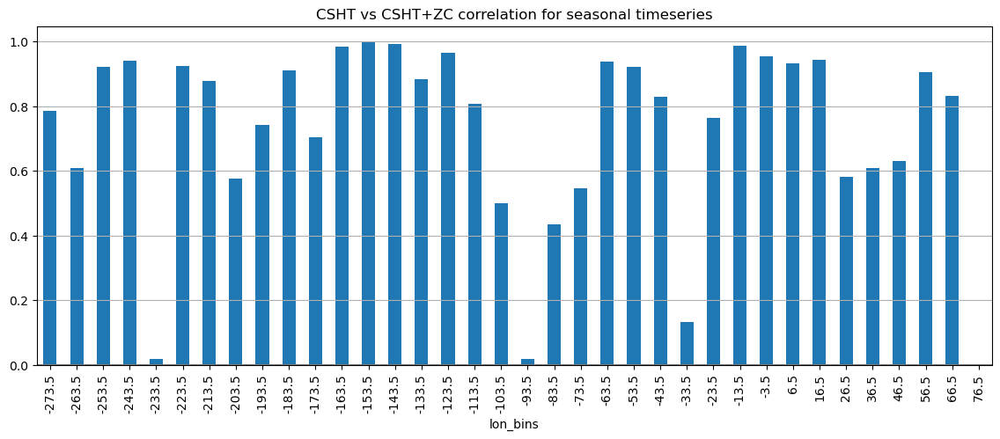

In [45]:
plt.figure(figsize=(14,5))
plt.plot([-280,80],[0,0],color='grey')
clima_correlations_per_bin.to_series().plot.bar()
#plt.plot([-280,80],[0.8,0.8],color='grey')
plt.grid(axis='y')
plt.title('CSHT vs CSHT+ZC correlation for seasonal timeseries')

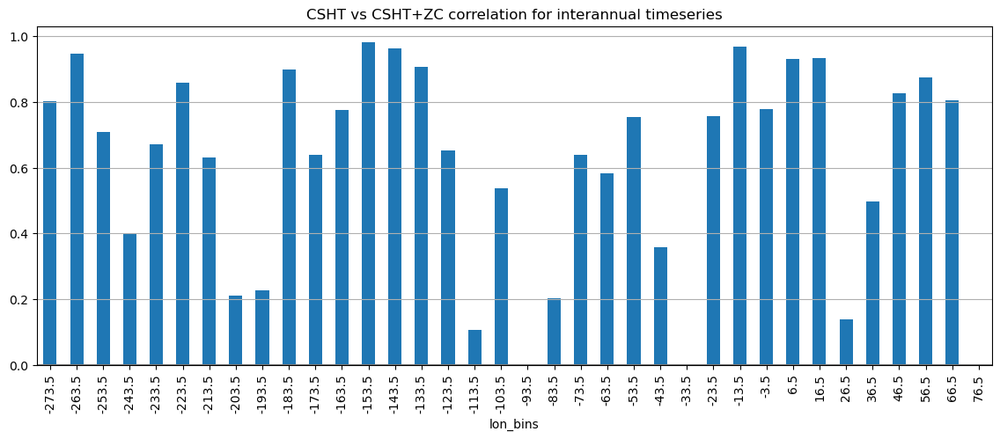

In [46]:
plt.figure(figsize=(14,5))
plt.plot([-280,80],[0,0],color='grey')
annual_correlations_per_bin.to_series().plot.bar()
#plt.plot([-280,80],[0.8,0.8],color='grey')
plt.title('CSHT vs CSHT+ZC correlation for interannual timeseries')
plt.grid(axis='y')

It seems to me that zonal conergence do matter for the correlations. I should try to recalculate the correlations without the zonal convergence

## Unbinned velocities 

The storyline for the Dense shelf is getting a little wonky, as the CSHT becomes negative when the ASC is weaker (in both Glomar and Mertz regions), which doesnt fit into the storyline of the slope. It might be weorth to look at the velocities unbinned for these regions

Find years when CDWlayer u_along is strongly westward (or less eastward):

In [47]:
##########################
hu_transect_list = []
hu_sliced_list = []
max_lat = []
southward_threshold = []
northward_threshold = []
temp_southward = []
temp_northward = []
rho_southward = []
rho_northward = []
u_southward = []
u_northward = []
neg_ASC_y = [0,1,2] #0,1,2 are the first second and third region
pos_ASC_y = [0,1,2] #0,1,2 are the first second and third region

longitude_slices_10dg = [-63.5,-133.5, -173.5]
for i in tqdm(range(np.size(longitude_slices_10dg))):
    print(i)
    # select out longitude:
    u_along_regional = U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices_10dg[i])
    
    # find u_along threshold for most southward 100 months:
    u_sorted = u_along_regional.sortby(u_along_regional)
    npoints = 10
    southward_threshold.append(u_sorted[npoints].data) #negative, westward threshold for ASC
    northward_threshold.append(u_sorted[-npoints].data) #Positive, eastward threshold for ASC
    #10 years with most negative ASC
    neg_ASC_y[i]  = u_sorted[:10].year
    #10 years with most positive ASC
    pos_ASC_y[i] = u_sorted[-10:].year

100%|██████████| 3/3 [00:00<00:00, 652.30it/s]

0
1
2


In [48]:
neg_ASC_y_glomar = neg_ASC_y[2]
pos_ASC_y_glomar = pos_ASC_y[2]

In [49]:
u_along_unbinned = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/ASC_speed/daily_rho/OM2_IAF_XYgrid/Antarctic_slope_contour_1km_velocities*.nc')

In [50]:
lon_slice_glomar= slice(-173.5-5,-173.5+5)
LONLATdata = xr.open_dataset('/g/data/x77/wf4500/ASC_project/cross_slope_transport/Monthly/01deg_jra55v13_ryf9091/Ant_cross_slope_heat_terms_online_1000m_2098-12.nc')
lon_along_contour = LONLATdata.lon_along_contour.rename({'lon_along_contour':'contour_index'})
lon_along_contour['contour_index']=u_along_unbinned.contour_index
#glomar_mask = (lon_along_contour.where(lon_along_contour <=-173.5+5).where(lon_along_contour >=-173.5-5)*0)+1
#
u_along_unbinned_annual = u_along_unbinned.u_along_contour.sel().resample(time='1Y').mean().compute()


In [51]:
u_along_unbinned_annual_glomar = u_along_unbinned_annual.where(lon_along_contour <=-173.5+5).where(lon_along_contour >=-173.5-5).\
dropna('contour_index',how='all').dropna('potrho0',how='all').groupby('time.year').mean()

In [52]:
u_along_unbinned_annual_glomar_negyears = u_along_unbinned_annual_glomar.sel(year=neg_ASC_y_glomar).mean('year')
u_along_unbinned_annual_glomar_posyears = u_along_unbinned_annual_glomar.sel(year=pos_ASC_y_glomar).mean('year')

(28.0, 24.0)

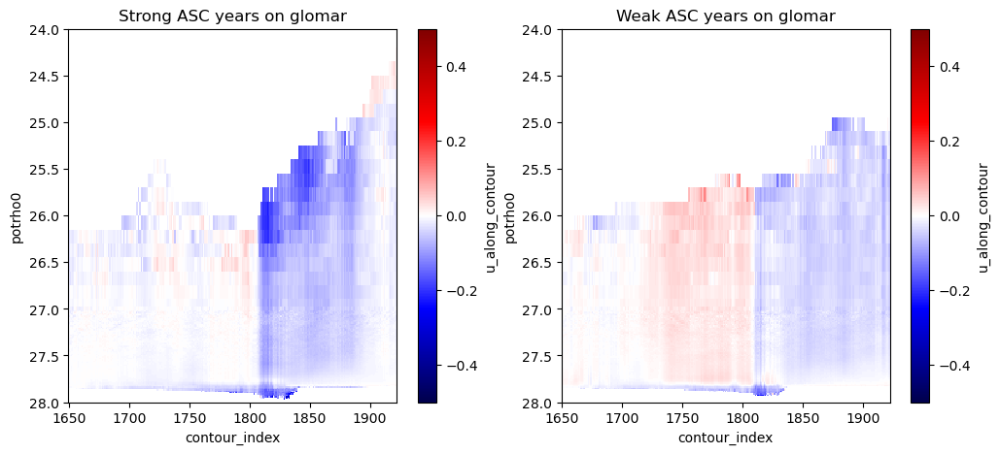

In [53]:
#strong years view
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
u_along_unbinned_annual_glomar_negyears.plot(y='potrho0',vmin=-.5,vmax=.5,cmap='seismic')
plt.title('Strong ASC years on glomar')
plt.ylim(28,24)
plt.subplot(1,2,2)
u_along_unbinned_annual_glomar_posyears.plot(y='potrho0',vmin=-.5,vmax=.5,cmap='seismic')
plt.title('Weak ASC years on glomar')
plt.ylim(28,24)

(28.0, 24.0)

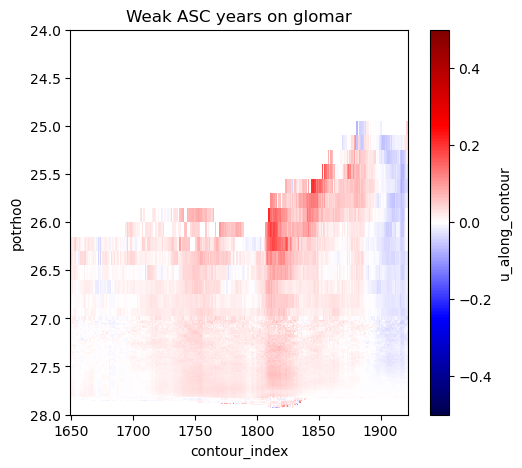

In [54]:
#Weak minus strong years on glomar
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
(u_along_unbinned_annual_glomar_posyears - u_along_unbinned_annual_glomar_negyears).plot(y='potrho0',vmin=-.5,vmax=.5,cmap='seismic')
plt.title('Weak ASC years on glomar')
plt.ylim(28,24)

I guess weak on average doesn mean weak locally, and there is a chance that stronger stripe on the densest layers are on the path of the DSW overflow

## Transport across isobath

It seems quite ambiguous the periods where we have strong and weak DSW transports across isobath in GLomar region, so lets expreslsy calculate the mass transport across isobath in that bin, for the strong and weak ASC years

In [55]:
#Importing Christina's volume transports across isobath
Vol_transport = xr.open_mfdataset('/g/data/e14/cs6673/iav_AABW/data_iav_AABW_final/vol_trans_across_contour_01deg_jra55v140_iaf_cycle3_1d_*.nc').vol_trans_across_contour.groupby('time.year').mean()

In [56]:
Vol_transport_glomar = Vol_transport.where(lon_along_contour <=-173.5+5).where(lon_along_contour >=-173.5-5).\
dropna('contour_index',how='all').sum('contour_index')

In [57]:
Vol_transport_glomar_negyears = (1e-6*Vol_transport_glomar.sel(year = neg_ASC_y_glomar).mean('year')[::-1].cumsum('isopycnal_bins')).compute() #in SV
Vol_transport_glomar_posyears = (1e-6*Vol_transport_glomar.sel(year = pos_ASC_y_glomar).mean('year')[::-1].cumsum('isopycnal_bins')).compute() #in SV

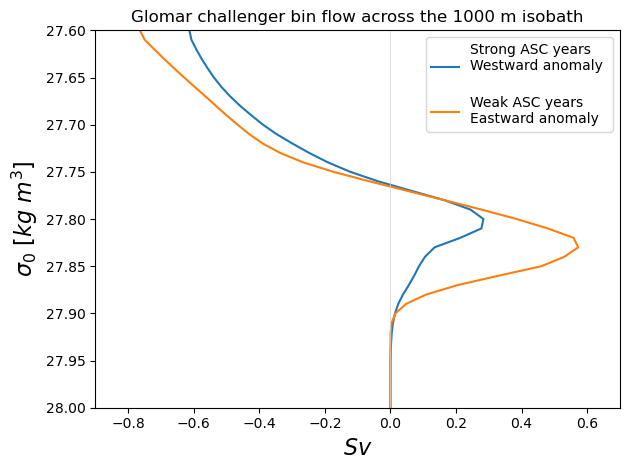

In [60]:
Vol_transport_glomar_negyears.plot(y = 'isopycnal_bins',label = 'Strong ASC years \nWestward anomaly \n')
Vol_transport_glomar_posyears.plot(y = 'isopycnal_bins',label = 'Weak ASC years \nEastward anomaly')
#plt.plot([-0.9,0.7],[27.87,27.87],color='black',linestyle=':')
plt.plot([0,0],[27.6,28],color='lightgray',linestyle='-',linewidth=0.5)
plt.legend()
plt.ylim(28,27.6)
plt.xlim(-0.9,0.7)
plt.ylabel('$\sigma_0$ [$kg\ m^{3}$]',fontsize = 16)
plt.title('Glomar challenger bin flow across the 1000 m isobath')
plt.xlabel('$Sv$',fontsize =16)
figure_path = '/g/data/x77/wf4500/ASC_project/analysis_figs/glomar_overflow.png'
plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
## Show the plots
plt.tight_layout()


# DO NOT RUN FROM HERE ON

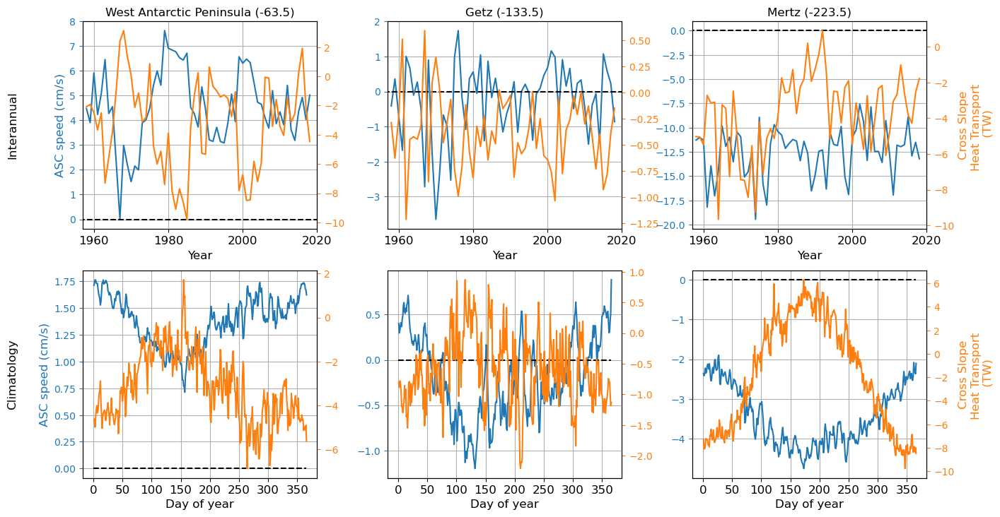

In [40]:
### OLD version with incorrect volume masking
fontsize=12

fig = plt.figure(figsize=(22*0.7, 12*0.7))

# Create a GridSpec for a 3x4 grid
grid = gs.GridSpec(nrows=2, ncols=3, figure=fig)
grid.update(hspace=0.2, wspace=0.3)  # Adjust vertical and horizontal spacing

# Initialize a list to store axes
axes = []

# Loop through the 3x4 grid to create subplots
for j in range(inds_regions.size):  # Loop over rows

    i = inds_regions[j]

    ax3 = fig.add_subplot(grid[0, j])
    ax4 = fig.add_subplot(grid[1, j])
    ###################
    ax3.set_title(regions[i] + ' (' + str(longitude_slices[i]) + ')')
        
    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    ax3.plot([1956,2024],[0,0],\
             linestyle='--',color='black')
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    if j == 0:    
        ax3.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
        ax3_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
    
    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid()
    ax3.set_xlim(1957,2020)
    ax3.set_xlabel('Year',fontsize=fontsize)
    ax3.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange

    ################
    
    ax4_HT=ax4.twinx()
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[i])*100,label='ASC')
    ax4.plot([0,365],[0,0],\
             linestyle='--',color='black')
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[i])/1e12),\
                label='CSHT',color='tab:orange')
    # ax3.set_ylim(u_along_lims[i])
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    if j == 0:    
        ax4.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    if j == inds_regions.size-1:
        ax4_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
    ax4.set_xlabel('Day of year',fontsize=fontsize)
    # ax4.set_xticks(ticks=np.arange(1960,2021,10),labels=np.arange(1960,2021,10), fontsize=14)
    ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50),fontsize=fontsize)
    #ax4.set_xlim(1,12)
    ax4.grid()
    # Set tick colors
    ax4.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange

ax3.text(-2.9,0.5, 'Interannual', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
ax4.text(-2.9,0.5, 'Climatology', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)

plt.tight_layout()
figure_path = figdir+'selected_time_series.png'
#plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
# Show the plots
plt.show()

## Plot interannual and seasonal time series for all regions

In [16]:
len(longitude_slices)

10

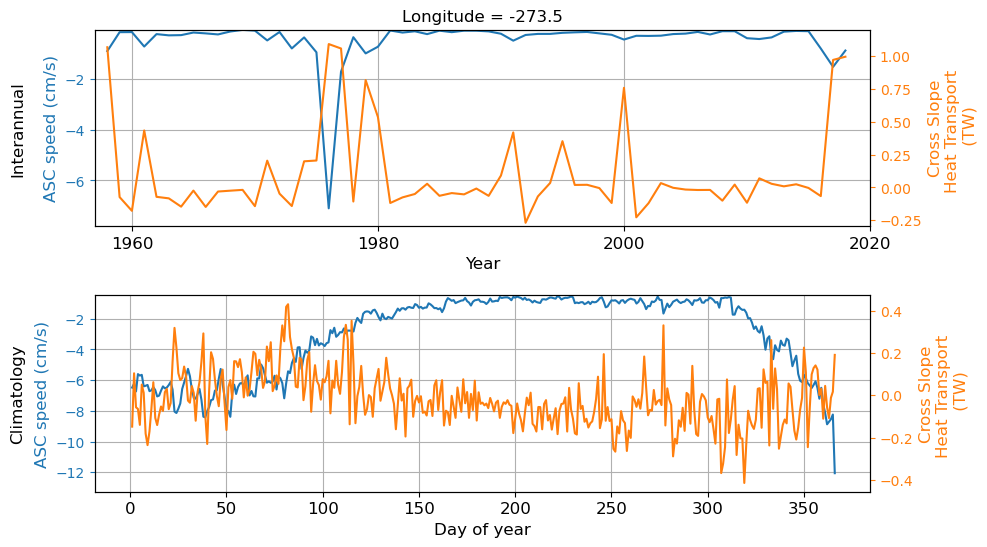

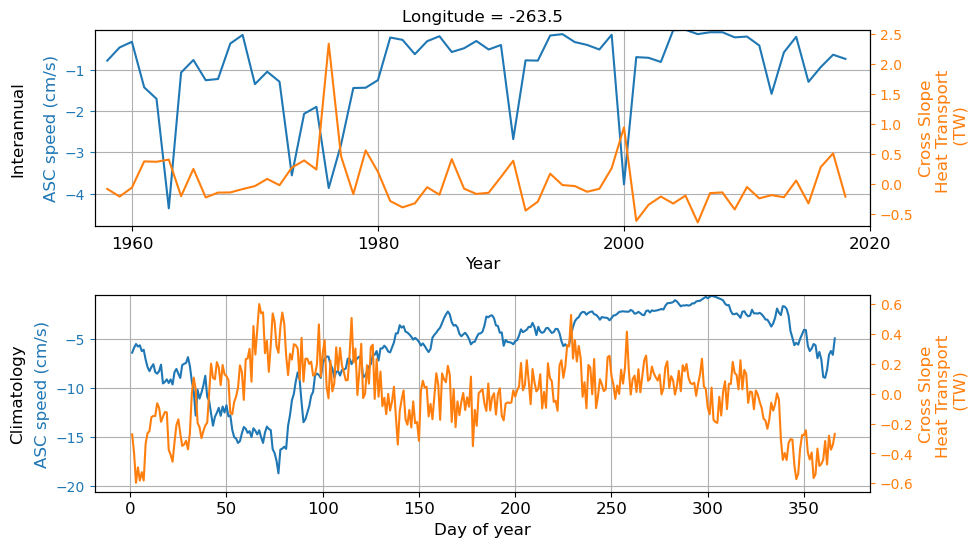

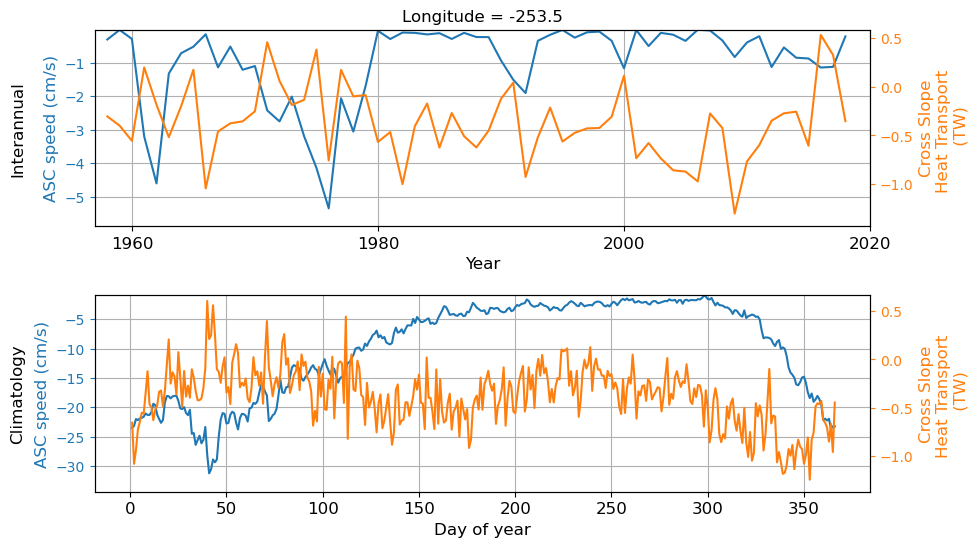

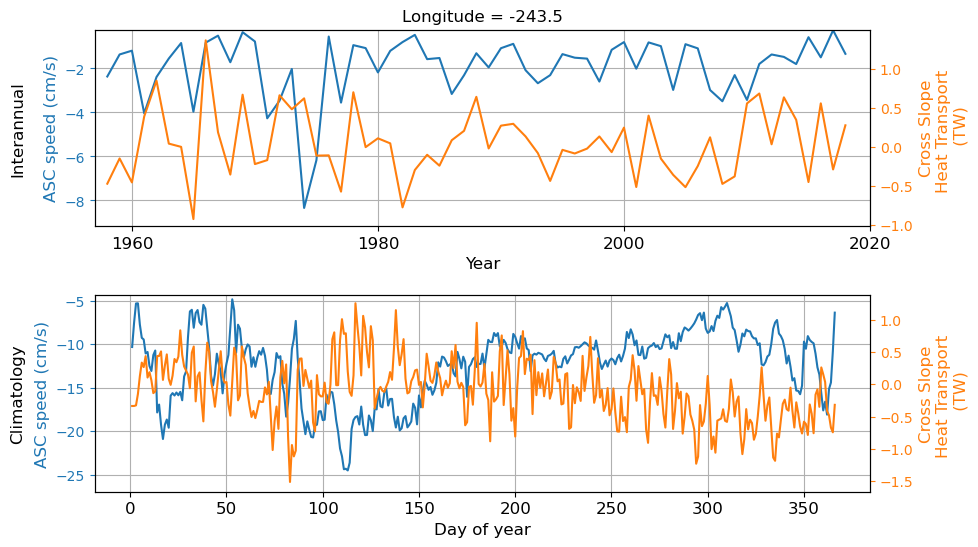

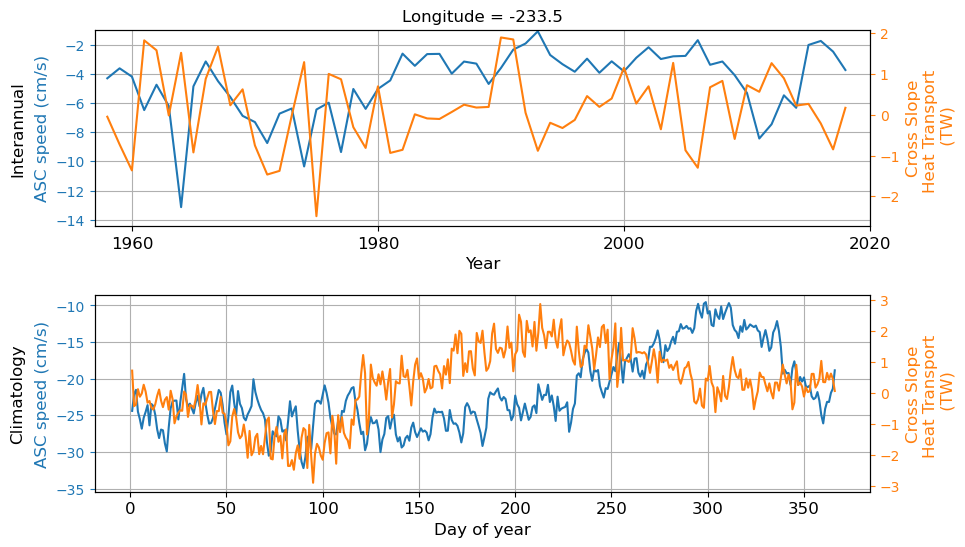

...

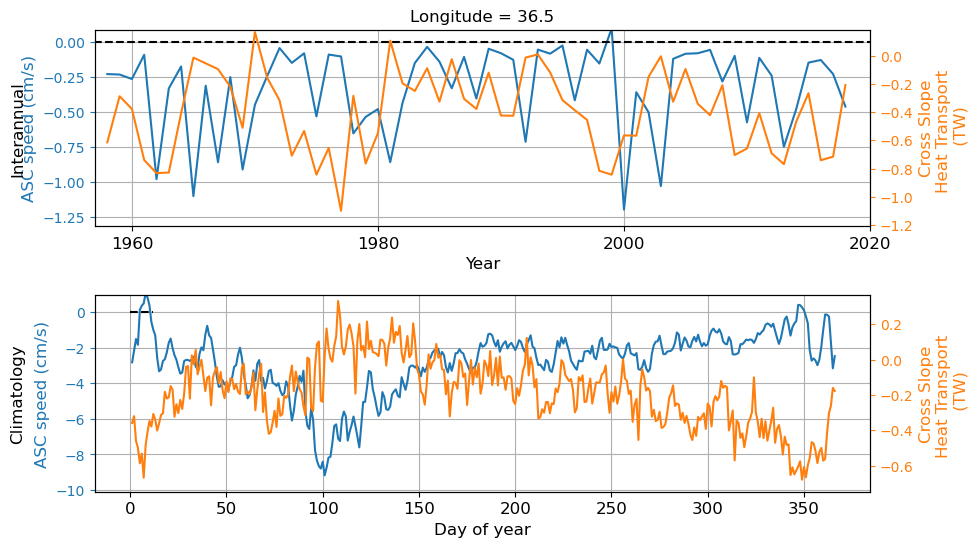

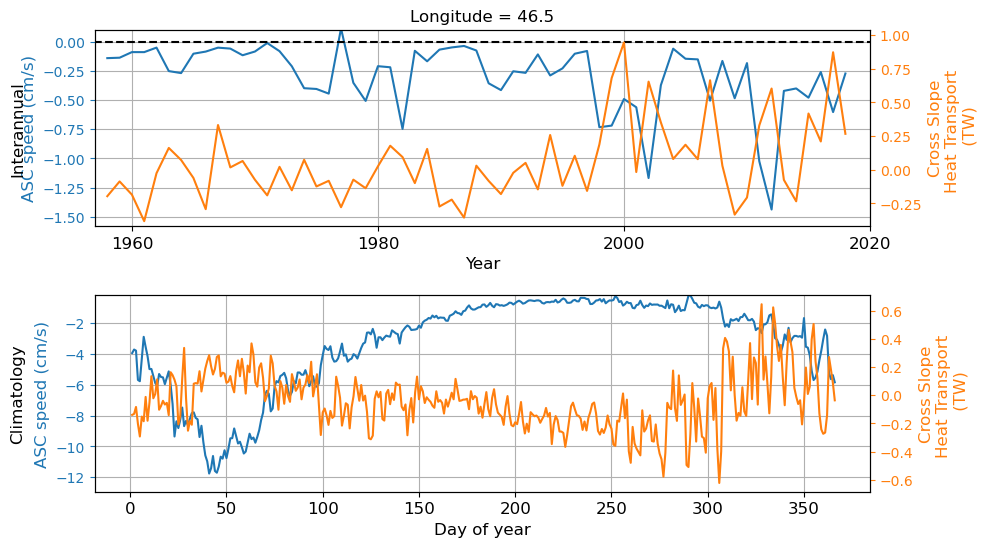

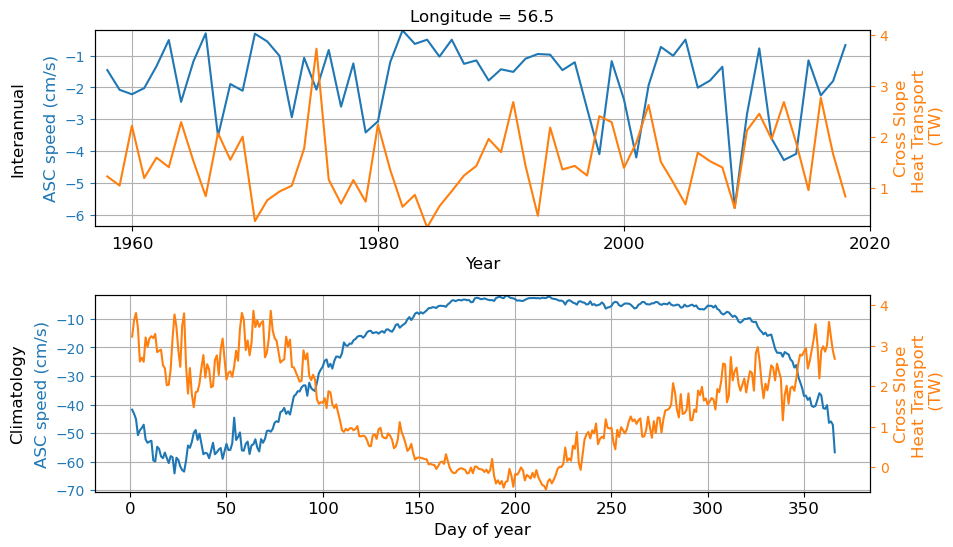

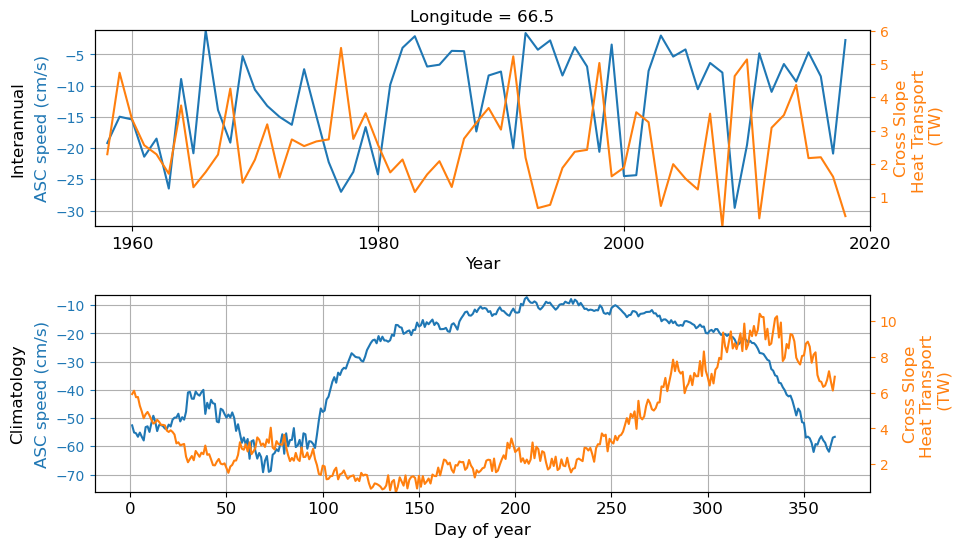

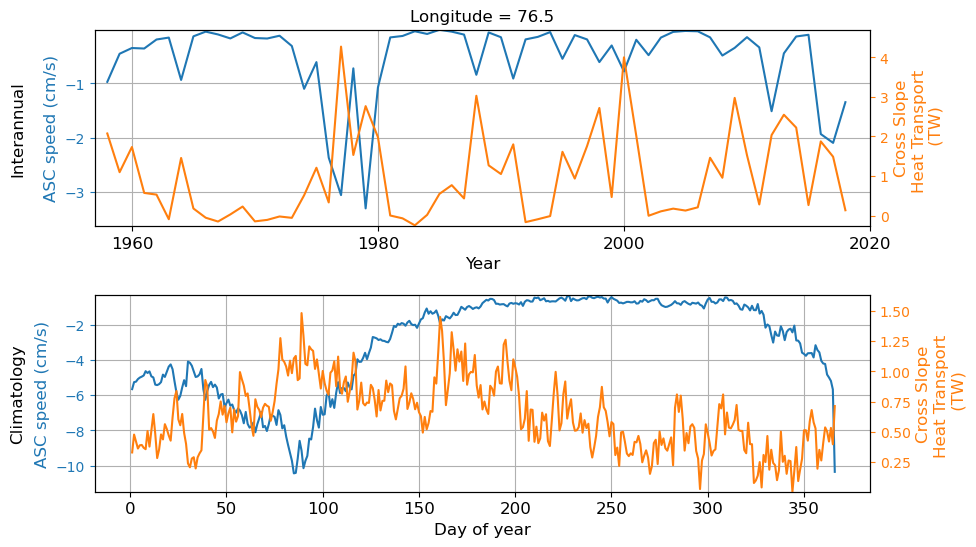

In [17]:
fontsize=12

longitude_slices = U_along_annual_binned_CDW_volav.lon_bins

for long in range(len(longitude_slices)):
    #long = 0
    
    fig = plt.figure(figsize=(10, 6))
    
    # Create a GridSpec for a 3x4 grid
    grid = gs.GridSpec(nrows=2, ncols=1, figure=fig)
    grid.update(hspace=0.35, wspace=0.95)  # Adjust vertical and horizontal spacing
    
    # Initialize a list to store axes
    axes = []
    
    ax3 = fig.add_subplot(grid[0, 0])
    ax4 = fig.add_subplot(grid[1, 0])
    ###################

    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long])*100,label='ASC')
    ax3.plot([1956,2024],[0,0],\
             linestyle='--',color='black')
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long])/1e12),\
                label='CSHT',color='tab:orange')
    ax3_HT.set_ylim((CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).min().values/1e12*1.1),
                    CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).max().values/1e12*1.1)
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    ax3.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
    ax3.set_ylim(U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long]).min().values*100*1.1,
                    U_along_annual_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long]).max().values*100*.9)
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    ax3_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
    
    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid()
    ax3.set_xlim(1957,2020)
    ax3.set_xlabel('Year',fontsize=fontsize)
    ax3.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange
    
    ################
    
    ax4_HT=ax4.twinx()
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long])*100,label='ASC')
    ax4.plot([0,12],[0,0],\
             linestyle='--',color='black')
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long])/1e12),\
                label='CSHT',color='tab:orange')
    ax4_HT.set_ylim((CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).min().values/1e12)*1.1,
                    (CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).max().values/1e12)*1.1)
    ax4.set_ylim()
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    ax4.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    ax4_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
    ax4.set_xlabel('Day of year',fontsize=fontsize)
    # ax4.set_xticks(ticks=np.arange(1960,2021,10),labels=np.arange(1960,2021,10), fontsize=14)
    ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50), fontsize=fontsize)
    #ax4.set_xlim(1,12)
    ax4.set_ylim(U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long]).min().values*100*1.1,
                    U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long]).max().values*100*.9)
    ax4.grid()
    # Set tick colors
    ax4.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange
    
    ax3.text(-0.1,0.5, 'Interannual', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
    ax4.text(-0.1,0.5, 'Climatology', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)
    
    ax3.set_title('Longitude = '+str(longitude_slices[long].data))
    plt.tight_layout()
    figure_path = figdir+'time_series_'+str(longitude_slices[long].data)+'.png'
    plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
    # Show the plots
    plt.show()